# Kütüphanelerin Yüklenmesi

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

# Verilerin Getirilmesi

In [2]:
columns=['BranchId','Date_','StockId','Type','Quantity','Unit','MovementType','FicheNo','FicheNoText','StockLink']
data_2021 = pd.read_excel('csv/stock-movement-2021.xlsx')
data_2022 = pd.read_excel('csv/stock-movement-2022.xlsx')

# Sadece Un Verilerini Alma

In [3]:
data_2021.columns = columns
data_2022.drop(labels=['id'],axis= 1, inplace=True)
data = pd.concat([data_2021[data_2021.StockId == 2], data_2022[data_2022.StockId == 2]], axis = 0, ignore_index=True)
print('Orjinal Veri Uzunluğu: ', len(data_2022))
print('Sadece Un Verisinin Uzunluğu: ',len(data))

Orjinal Veri Uzunluğu:  146946
Sadece Un Verisinin Uzunluğu:  4337


# Veriye Bakış

In [4]:
data.head()

,BranchId,Date_,StockId,Type,Quantity,Unit,MovementType,FicheNo,FicheNoText,StockLink
0,90,2020-12-31,2,1,78850.0,KG,Devir,0,DEVIR,NaN
1,4,2021-06-03,2,1,30.0,KG,Iç Tedarik,0,A90000000261270,NaN
2,90,2021-01-15,2,1,0.0,KG,Tedarikçiden Gelen Mal,0,000000000321949,NaN
3,90,2021-01-15,2,1,25000.0,KG,Tedarikçiden Gelen Mal,0,TZD202100000141,NaN
4,90,2021-01-18,2,1,15000.0,KG,Tedarikçiden Gelen Mal,0,TZD202100000163,NaN


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4337 entries, 0 to 4336
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   BranchId      4337 non-null   int64  
 1   Date_         4337 non-null   object 
 2   StockId       4337 non-null   int64  
 3   Type          4337 non-null   int64  
 4   Quantity      4337 non-null   float64
 5   Unit          4337 non-null   object 
 6   MovementType  4337 non-null   object 
 7   FicheNo       4337 non-null   int64  
 8   FicheNoText   4337 non-null   object 
 9   StockLink     4032 non-null   object 
dtypes: float64(1), int64(4), object(5)
memory usage: 339.0+ KB


In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
BranchId,4337.0,38.949504,43.174039,0.0,2.00,4.000,90.0,90.0
StockId,4337.0,2.000000,0.000000,2.0,2.00,2.000,2.0,2.0
Type,4337.0,-0.859811,0.510671,-1.0,-1.00,-1.000,-1.0,1.0
Quantity,4337.0,2183.478755,5545.352897,0.0,0.76,29.746,2350.0,96840.0
FicheNo,4337.0,0.000000,0.000000,0.0,0.00,0.000,0.0,0.0


In [7]:
data.corr()

,BranchId,StockId,Type,Quantity,FicheNo
BranchId,1.000000,NaN,0.322877,0.460771,NaN
StockId,NaN,NaN,NaN,NaN,NaN
Type,0.322877,NaN,1.000000,0.695384,NaN
Quantity,0.460771,NaN,0.695384,1.000000,NaN
FicheNo,NaN,NaN,NaN,NaN,NaN


In [8]:
data.groupby(['MovementType'])['Quantity'].sum()

MovementType
Devir                      272530.000
Gönderilen Mal                 30.000
Iade                            1.000
Iç Tedarik                     30.000
Tedarikçiden Gelen Mal    4660500.000
Üretime Giden Mal         4536656.361
Name: Quantity, dtype: float64

## Gereksiz Kolonların Düşürülmesi

In [9]:
data.drop(labels=['Unit','FicheNo','StockId'], axis = 1, inplace = True)

In [10]:
data.head()

,BranchId,Date_,Type,Quantity,MovementType,FicheNoText,StockLink
0,90,2020-12-31,1,78850.0,Devir,DEVIR,NaN
1,4,2021-06-03,1,30.0,Iç Tedarik,A90000000261270,NaN
2,90,2021-01-15,1,0.0,Tedarikçiden Gelen Mal,000000000321949,NaN
3,90,2021-01-15,1,25000.0,Tedarikçiden Gelen Mal,TZD202100000141,NaN
4,90,2021-01-18,1,15000.0,Tedarikçiden Gelen Mal,TZD202100000163,NaN


## Features Engineering

In [11]:
# dates Beginning 2020-12-31
data['Date_'] = pd.to_datetime(data['Date_'].astype('str'), infer_datetime_format = True)
data['day_of_year'] = data['Date_'].dt.dayofyear
data['day_of_year'] = pd.DataFrame(data['day_of_year'])
data['day_numbers'] = (data['Date_'] - min(data['Date_'])).dt.days
data['day_of_year'] = data['day_of_year'].replace([366],[0])
data['month'] = data['Date_'].dt.month
data['day_of_month'] = data['Date_'].dt.day
data['week_of_year'] = data['Date_'].dt.weekofyear
data['day_of_week'] = data['Date_'].dt.dayofweek
data["is_wknd"] = data['Date_'].dt.weekday // 5
# Aşağıdaki özellikleri OLS raporunda p değeri 0.05 in üstünde çıktığı için koymamayı tercih ettim.
#data['is_month_start'] = data['Date_'].dt.is_month_start.astype(int)
#data['is_month_end'] = data['Date_'].dt.is_month_end.astype(int)

In [12]:
data.drop(labels=['Date_'], axis = 1, inplace = True)

In [13]:
data.head()

,BranchId,Type,Quantity,MovementType,FicheNoText,StockLink,day_of_year,day_numbers,month,day_of_month,week_of_year,day_of_week,is_wknd
0,90,1,78850.0,Devir,DEVIR,NaN,0,0,12,31,53,3,0
1,4,1,30.0,Iç Tedarik,A90000000261270,NaN,154,154,6,3,22,3,0
2,90,1,0.0,Tedarikçiden Gelen Mal,000000000321949,NaN,15,15,1,15,2,4,0
3,90,1,25000.0,Tedarikçiden Gelen Mal,TZD202100000141,NaN,15,15,1,15,2,4,0
4,90,1,15000.0,Tedarikçiden Gelen Mal,TZD202100000163,NaN,18,18,1,18,3,0,0


In [14]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
BranchId,4337.0,38.949504,43.174039,0.0,2.00,4.000,90.0,90.0
Type,4337.0,-0.859811,0.510671,-1.0,-1.00,-1.000,-1.0,1.0
Quantity,4337.0,2183.478755,5545.352897,0.0,0.76,29.746,2350.0,96840.0
day_of_year,4337.0,169.998617,102.195132,0.0,90.00,155.000,263.0,365.0
day_numbers,4337.0,340.842518,150.461148,0.0,244.00,352.000,460.0,588.0
month,4337.0,5.921605,3.394745,1.0,3.00,6.000,9.0,12.0
day_of_month,4337.0,21.206825,9.704935,1.0,13.00,24.000,30.0,31.0
week_of_year,4337.0,24.460918,14.562323,1.0,13.00,22.000,38.0,53.0
day_of_week,4337.0,2.582430,1.846058,0.0,1.00,3.000,4.0,6.0
is_wknd,4337.0,0.176620,0.381391,0.0,0.00,0.000,0.0,1.0


In [15]:
ilk_devir = data.iloc[[0]]
devirsiz = data[data['MovementType']!= 'Devir']
data = pd.concat([ilk_devir, devirsiz], axis = 0)
print(data.head())

   BranchId  Type  Quantity            MovementType      FicheNoText  \
0        90     1   78850.0                   Devir            DEVIR   
1         4     1      30.0              Iç Tedarik  A90000000261270   
2        90     1       0.0  Tedarikçiden Gelen Mal  000000000321949   
3        90     1   25000.0  Tedarikçiden Gelen Mal  TZD202100000141   
4        90     1   15000.0  Tedarikçiden Gelen Mal  TZD202100000163   

  StockLink  day_of_year  day_numbers  month  day_of_month  week_of_year  \
0       NaN            0            0     12            31            53   
1       NaN          154          154      6             3            22   
2       NaN           15           15      1            15             2   
3       NaN           15           15      1            15             2   
4       NaN           18           18      1            18             3   

   day_of_week  is_wknd  
0            3        0  
1            3        0  
2            4        0  
3     

## Önemli Not

Veride 480. gününde çok fazla alış oluyor. Bunun sebebi ise 480. gün (25 Nisan 2022) bir hafta un zammının ertelendiği haberi. Zamdan önce bir haftadan kısa sürede 200 ton un girmiş. Bu da son 15 ayın toplam stoğuna eşdeğer.

Aşağıdaki satırı incelemek için çalıştırdım.

In [16]:
#data = data[data['day_numbers'] <= 479]

# Günlük Toplam Un Verileri

In [17]:
sum = 0
sum_list = np.array([])
days = data['day_numbers'].unique()
days = np.sort(days)
for day in days: #0
    for i in range(len(data[data['day_numbers']==day]['day_numbers'])):
        sum = sum  + (np.array(data[data['day_numbers'] == day]['Quantity'])[i] * np.array(data[data['day_numbers'] == day]['Type'])[i]) 
    sum_list = np.append(sum_list, sum)
    print(day,' is ', sum)
    #Kümülatif toplam için aşağıdaki satırı sil
    sum = 0

0  is  78850.0
2  is  -4750.0
3  is  -100.0
4  is  -6250.0
5  is  -5850.0
6  is  -5750.0
7  is  -5550.0
8  is  -6350.0
9  is  -4250.0
10  is  -250.0
11  is  -5900.0
12  is  -5400.0
13  is  -5200.0
14  is  -5400.0
15  is  19000.0
16  is  -4600.0
17  is  -300.0
18  is  8800.0
19  is  -5450.0
20  is  -5650.0
21  is  -5650.0
22  is  18200.0
23  is  -4950.0
24  is  -350.0
25  is  18350.0
26  is  -5750.0
27  is  9050.0
28  is  -5750.0
29  is  -6850.0
30  is  -5050.0
31  is  -4259.771699999999
32  is  -6800.0
33  is  19050.0
34  is  -6100.0
35  is  -6000.0
36  is  -6900.0
37  is  -5250.0
38  is  -600.0
39  is  -6650.0
40  is  21300.0
41  is  -5650.0
42  is  -5400.0
43  is  20650.0
44  is  -5250.0
45  is  -550.0
46  is  -6700.0
47  is  -5450.0
48  is  -5500.0
49  is  -5550.0
50  is  18450.0
51  is  -5250.0
52  is  -650.0
53  is  -6550.0
54  is  19350.0
55  is  -6000.0
56  is  -5850.0
57  is  -7050.0
58  is  -4700.0
59  is  -1597.9353999999996
60  is  19950.0
61  is  -6150.0
62  is  -6200.0
63 

  is  -6250.0
208  is  12800.0
209  is  -5950.0
210  is  -5500.0
211  is  -9405.962099999995
212  is  14800.0
214  is  -6100.0
215  is  -5350.0
216  is  19350.0
217  is  -5504.0
218  is  19350.0
219  is  -5450.0
221  is  -8800.0
222  is  -5500.0
223  is  -5800.0
224  is  14500.0
225  is  -6000.0
226  is  -5350.0
228  is  -6250.0
229  is  60850.0
230  is  -5450.0
231  is  -5200.0
232  is  16000.0
233  is  -4850.0
235  is  -5751.0
236  is  15950.0
237  is  -5300.0
238  is  -5000.0
239  is  -5500.0
240  is  -4800.0
242  is  15750.0
243  is  -7034.581300000001
244  is  -38.62599999999999
245  is  -4800.0
246  is  13413.832000000002
247  is  -4600.0
249  is  -5295.2
250  is  -5100.0
251  is  15776.771000000004
252  is  -4900.0
253  is  -5296.023
254  is  13750.0
256  is  -5666.951
257  is  -5100.0
258  is  -5231.0740000000005
259  is  -5000.0
260  is  12064.211000000003
261  is  -4800.0
263  is  7264.576000000001
264  is  -5050.0
265  is  -5329.48
266  is  -4950.0
267  is  -5479.72600000000

# Günlük  Kümülatif Toplam Un Grafiği

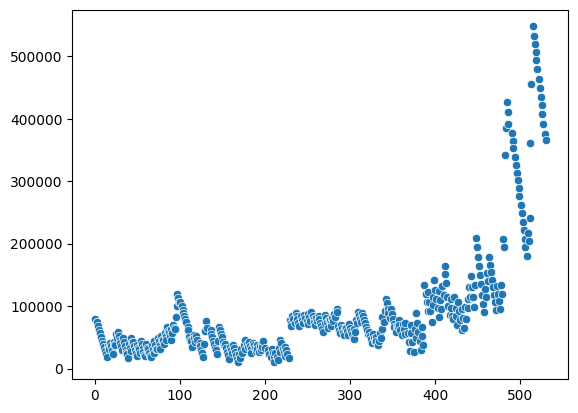

<Figure size 1000x1000 with 0 Axes>

In [85]:
sum = 0
sum_list = np.array([])
days = data['day_numbers'].unique()
days = np.sort(days)
for day in days:
    for i in range(len(data[data['day_numbers']==day]['day_numbers'])):
        sum = sum  + (np.array(data[data['day_numbers'] == day]['Quantity'])[i] * np.array(data[data['day_numbers'] == day]['Type'])[i]) 
    sum_list = np.append(sum_list, sum)
sns.scatterplot(x= days, y=sum_list)
plt.figure(figsize = (10,10))
plt.show()

## Kümülatif Toplamı Ekleme

In [19]:
sum = 0
sum_list = np.array([])
data = data.sort_values(by=['day_numbers'])
for i in range(len(data['day_numbers'])):
    sum = sum  + (np.array(data['Quantity'])[i] * np.array(data['Type'])[i]) 
    sum_list = np.append(sum_list, sum)
data['Cumulative'] = sum_list

In [20]:
data['FicheNoText'] = data['FicheNoText'].astype(str)

## Sadece Un Verisini Excel ve Csv Dosyalarına Kaydetme

In [21]:
file_name = "un_2021_2022.xlsx"
data.to_excel(file_name)
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


In [22]:
file_name = "un_2021_2022.csv"
data.to_csv(file_name)
print('DataFrame is written to CSV File successfully.')

DataFrame is written to CSV File successfully.


# Label Encoder

In [23]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data['MovementType'] = le.fit_transform(data['MovementType'])
data['FicheNoText'] = le.fit_transform(data['FicheNoText'])
data['StockLink'] = le.fit_transform(data['StockLink'])
data['FicheNoText'] = pd.to_numeric(data['FicheNoText'])
data.head()

,BranchId,Type,Quantity,MovementType,FicheNoText,StockLink,day_of_year,day_numbers,month,day_of_month,week_of_year,day_of_week,is_wknd,Cumulative
0,90,1,78850.0,0,1241,18,0,0,12,31,53,3,0,78850.0
1655,90,-1,2900.0,5,0,1,2,2,1,2,53,5,1,75950.0
1656,90,-1,1850.0,5,1,2,2,2,1,2,53,5,1,74100.0
1657,90,-1,100.0,5,61,1,3,3,1,3,53,6,1,74000.0
1658,90,-1,3550.0,5,2,1,4,4,1,4,1,0,0,70450.0


## Backward Elimination İçin Sütun Azaltma

In [24]:
#data.drop(labels=[], axis = 1, inplace = True)

# Validasyon Seti Son %10

In [25]:
samples_len = len(data['Type']) * 0.1
sample_data = data.iloc[(-1 * int(samples_len)):-1]
data1 = sample_data.iloc[:,0:1]
data2 = sample_data.iloc[: ,2:]
columns=['BranchId','Quantity','MovementType','FicheNoText','StockLink','day_of_year','day_numbers','month','day_of_month','week_of_year',
        'day_of_week','is_wknd','Cumulative']
sample_others = pd.concat([data1, data2],ignore_index=True, axis = 1)
sample_others.columns = columns
data = data.iloc[:(len(data['Type']) - int(samples_len))]
#data = data.sort_values(by=['day_numbers'])

## Standard Scale

# Train Test Split

In [26]:
from sklearn.model_selection import train_test_split

In [27]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size = 0.2)

# XG-Boost

In [28]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(
    n_estimators=1000, 
    max_depth=7, 
    eta=0.1, 
    subsample=0.7, 
    colsample_bytree=0.8
)

xgb_model.fit(X_train, y_train)
preds = xgb_model.predict(X_test)

### Lime

In [29]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode='regression'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = xgb_model.predict
)

xgb_exp.show_in_notebook(show_table = True)

### Shap

100%|===================| 779/781 [00:28<00:00]        

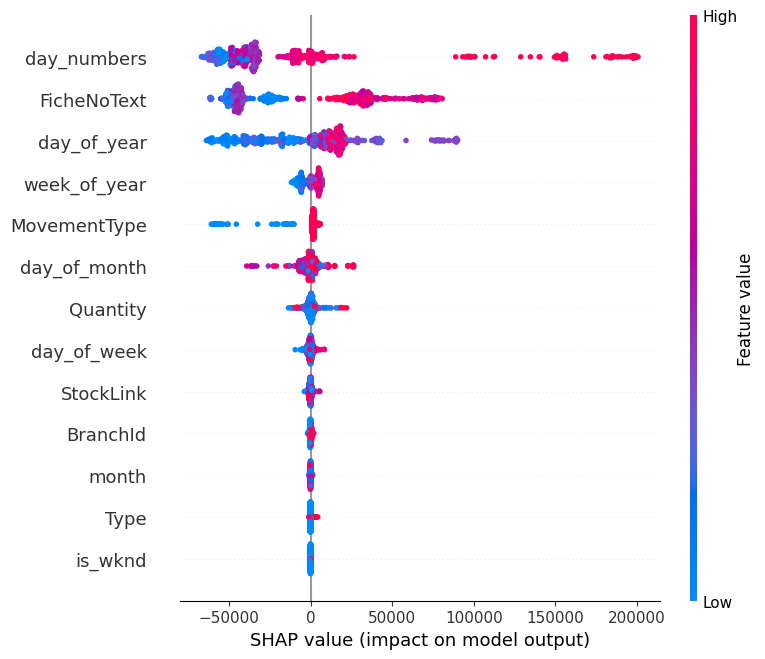

In [30]:
import shap 
shap.initjs()

explainer = shap.Explainer(xgb_model, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

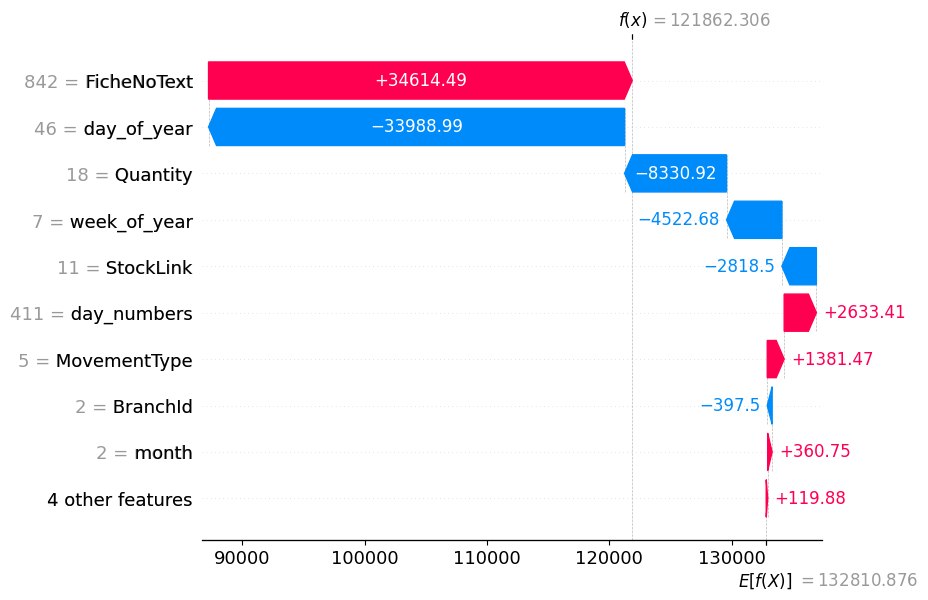

In [31]:
shap.plots.waterfall(shap_values[3])

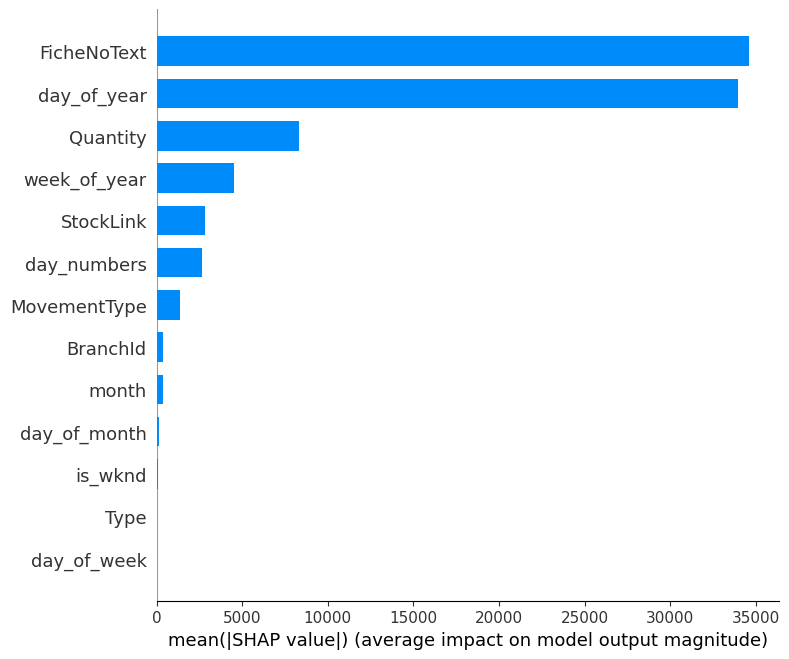

In [32]:
shap.summary_plot(shap_values[3:4], X_test, plot_type="bar")

In [33]:
shap.initjs()
shap.plots.force(shap_values[3])

# Light GBM

In [34]:
import lightgbm as lgb

lgb_model = lgb.LGBMRegressor(colsample_bytree=1,
                             learning_rate=0.01,
                             max_depth=9,
                             n_estimators = 1500)
lgb_model.fit(X_train, y_train)
predicts = lgb_model.predict(X_test)

#### Lime

In [35]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode='regression'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = lgb_model.predict
)

xgb_exp.show_in_notebook(show_table = True)

### Shap

 97%|=================== | 761/781 [00:35<00:00]       

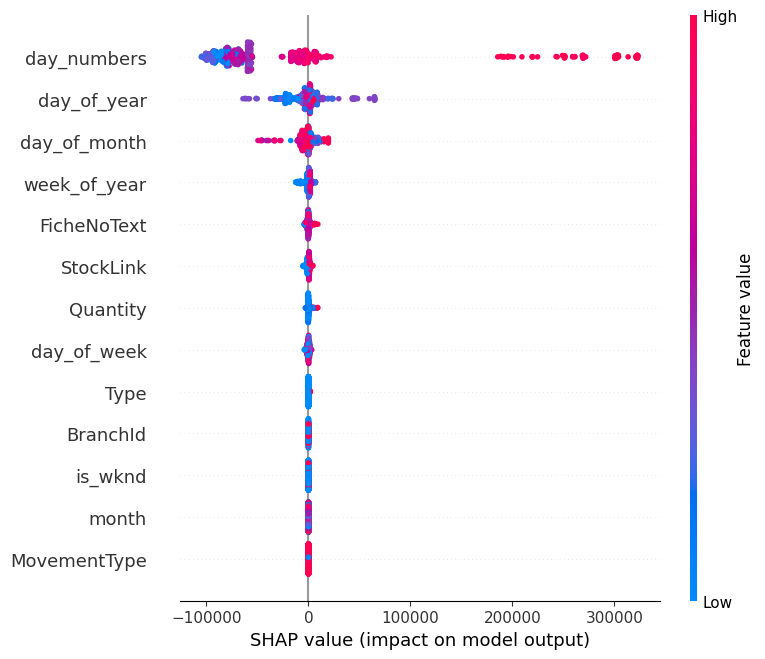

In [36]:
import shap 

shap.initjs()

explainer = shap.Explainer(lgb_model, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

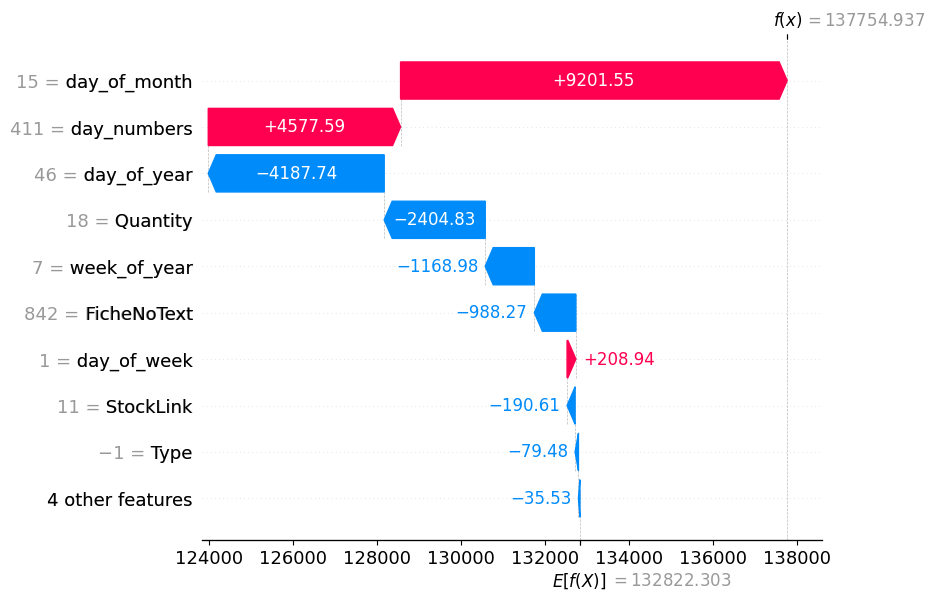

In [37]:
shap.plots.waterfall(shap_values[3])

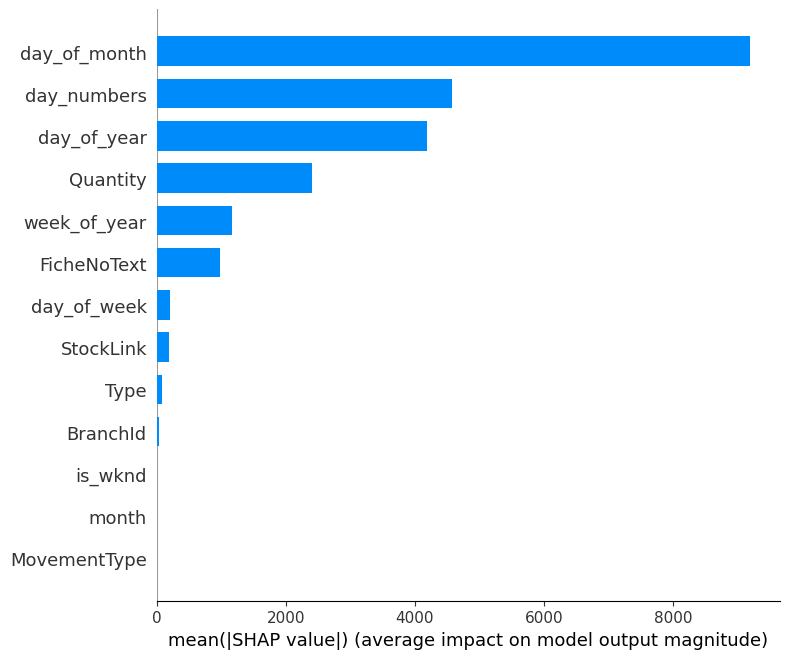

In [38]:
shap.summary_plot(shap_values[3:4], X_test, plot_type="bar")

In [39]:
shap.initjs()
shap.plots.force(shap_values[3])

## Random Forest Regressor

In [40]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

In [49]:
regressor = RandomForestRegressor(n_estimators=1600,
                                 min_samples_split=5,
                                 min_samples_leaf=1,
                                 max_features='auto',
                                 max_depth=10,
                                 bootstrap=True)
regressor.fit(X_train, y_train)

rfg_pred = regressor.predict(X_test)

### Lime

In [42]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    mode='regression'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = regressor.predict
)

xgb_exp.show_in_notebook(show_table = True)

### Shap

100%|===================| 780/781 [03:34<00:00]        

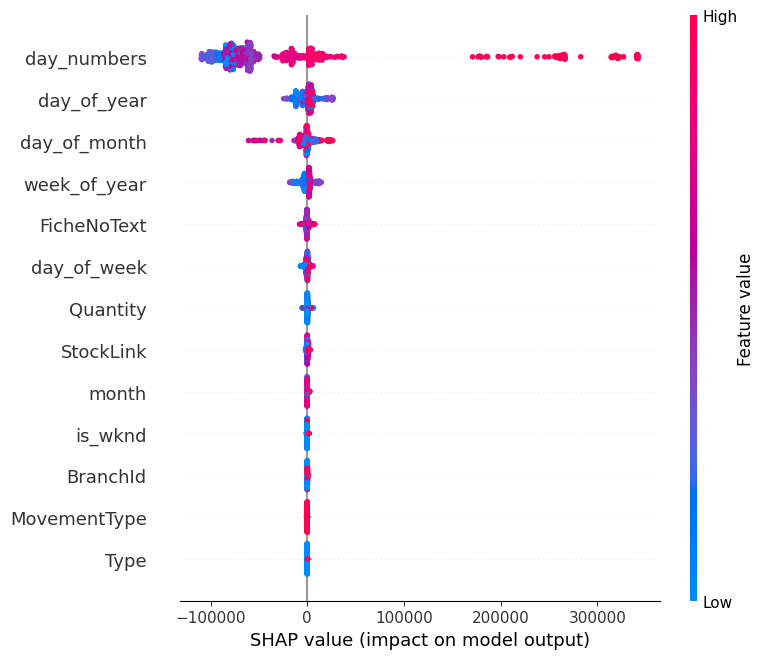

In [43]:
import shap 
shap.initjs()

explainer = shap.Explainer(regressor, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

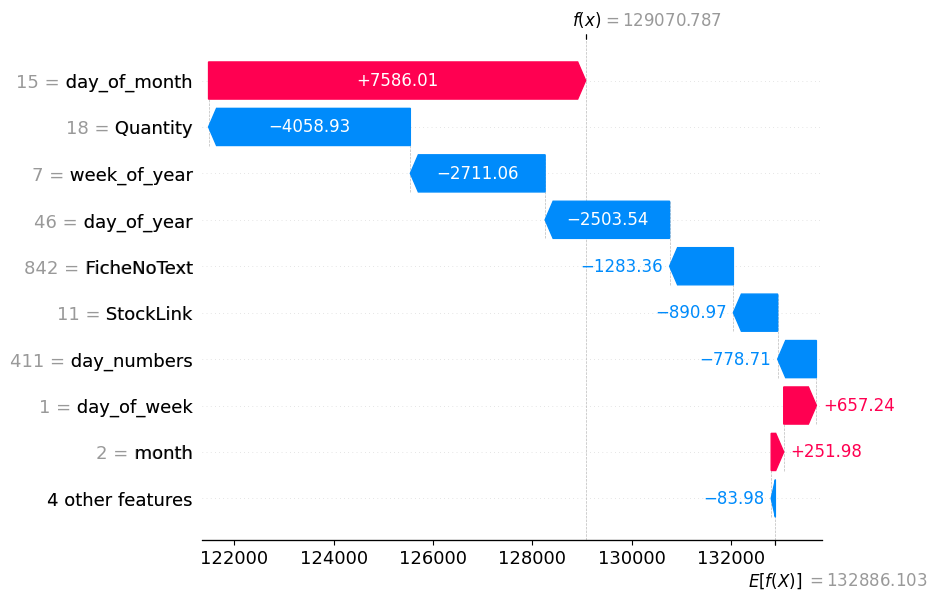

In [44]:
shap.plots.waterfall(shap_values[3])

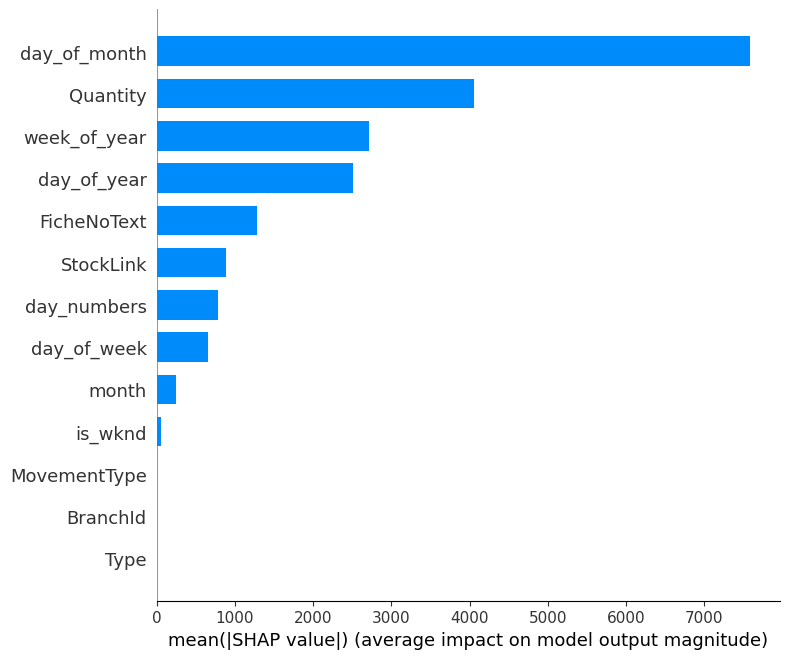

In [45]:
shap.summary_plot(shap_values[3:4], X_test, plot_type="bar")

In [46]:
shap.initjs()
shap.plots.force(shap_values[3])

# R2 SCORE

In [50]:
print('LİGHT-GBM R2 Score: ',r2_score(y_test, predicts))
print('XG-Boost R2 Score: ',r2_score(y_test, preds))
print('Random Forest Regressor R2 Score: ',r2_score(y_test, rfg_pred))

LİGHT-GBM R2 Score:  0.9936765331970978
XG-Boost R2 Score:  0.991231278840443
Random Forest Regressor R2 Score:  0.9935460818130598


##  MAE SCORE

In [51]:
print('LİGHT-GBM MAE: ',mean_absolute_error(y_test, predicts))
print('XG-BOOST MAE: ',mean_absolute_error(y_test, preds))
print('Random Forest Regressor MAE: ',mean_absolute_error(y_test, rfg_pred))

LİGHT-GBM MAE:  5927.255606577885
XG-BOOST MAE:  6000.934784851145
Random Forest Regressor MAE:  5917.794146348817


# Mean Squared Error

In [52]:
print('LİGHT-GBM MSE Score:',np.sqrt(mean_squared_error(y_test,predicts)))
print('XG-BOOST MSE Score:',np.sqrt(mean_squared_error(y_test,preds)))
print('RANDOM FOREST MSE Score:',np.sqrt(mean_squared_error(y_test,rfg_pred)))

LİGHT-GBM MSE Score: 8608.40245933017
XG-BOOST MSE Score: 10137.084610828231
RANDOM FOREST MSE Score: 8696.74366116268


# Classification

In [53]:
types = data.iloc[:, 1:2]
data1 = data.iloc[:,0:1]
data2 = data.iloc[: ,2:]
columns=['BranchId','Quantity','MovementType','FicheNoText','StockLink','day_of_year','day_numbers','month','day_of_month','week_of_year',
        'day_of_week','is_wknd','Cumulative']
others = pd.concat([data1, data2],ignore_index=True, axis = 1)
others.columns = columns

In [54]:
X_train, X_test, y_train, y_test = train_test_split(others, types, test_size = 0.2)

y_test = np.where(y_test == -1, 0, y_test)
y_train = np.where(y_train == -1, 0, y_train)

In [55]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)
xgb_model.fit(X_train, y_train)
preds = xgb_model.predict(X_test)

### Lime

In [91]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    class_names = ['-1', '1'],
    mode='classification'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = xgb_model.predict_proba
)

xgb_exp.show_in_notebook(show_table = True)

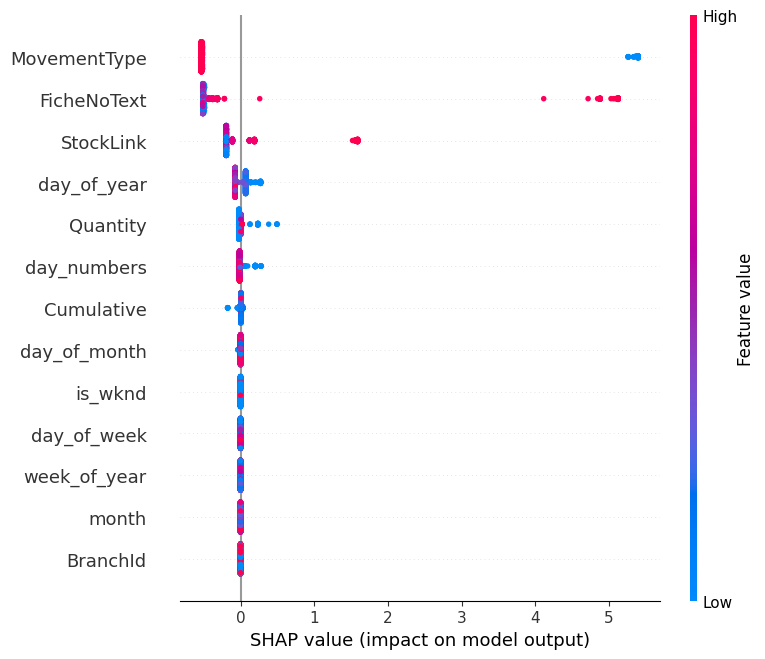

In [58]:
import shap 

shap.initjs()

explainer = shap.Explainer(xgb_model, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

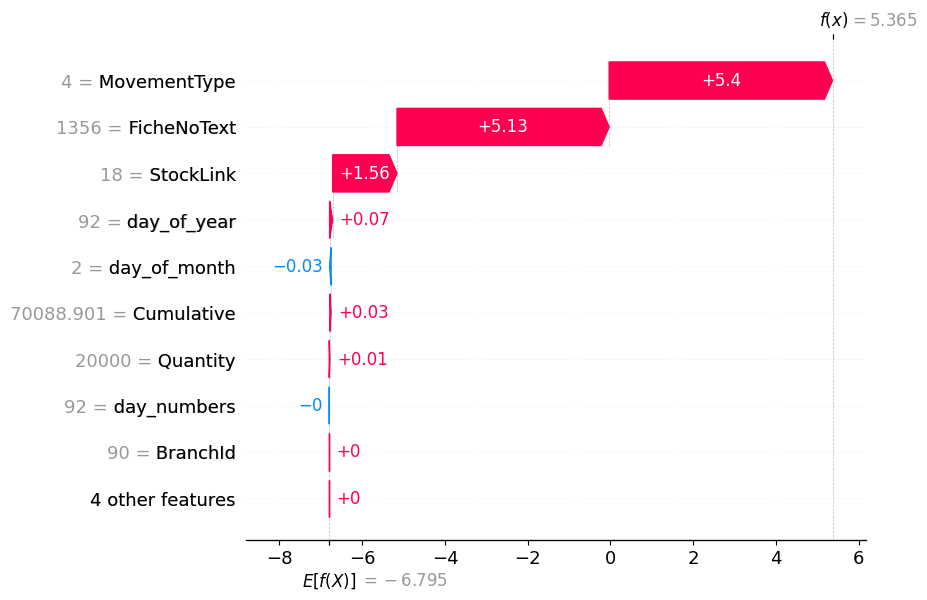

In [59]:
shap.plots.waterfall(shap_values[3])

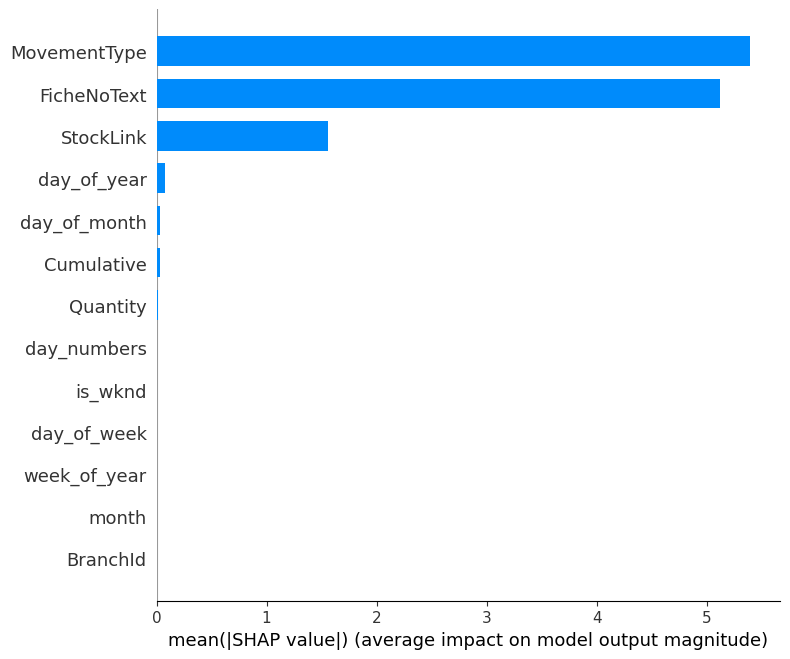

In [60]:
shap.summary_plot(shap_values[[3]], X_test, plot_type="bar")

In [61]:
shap.initjs()
shap.plots.force(shap_values[3])

In [62]:
import lightgbm as lgb

In [63]:
lgb_model = lgb.LGBMClassifier(colsample_bytree=1,
                             learning_rate=0.01,
                             max_depth=9,
                             n_estimators = 1500)
lgb_model.fit(X_train, y_train)
predicts = lgb_model.predict(X_test)

### Lime

In [64]:
lgb_model.predict(X_test.iloc[[2]])

array([0], dtype=int64)

In [65]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    class_names = ['-1', '1'],
    mode='classification'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = lgb_model.predict_proba
)

xgb_exp.show_in_notebook(show_table = True)

 93%|=================== | 730/781 [00:15<00:01]       

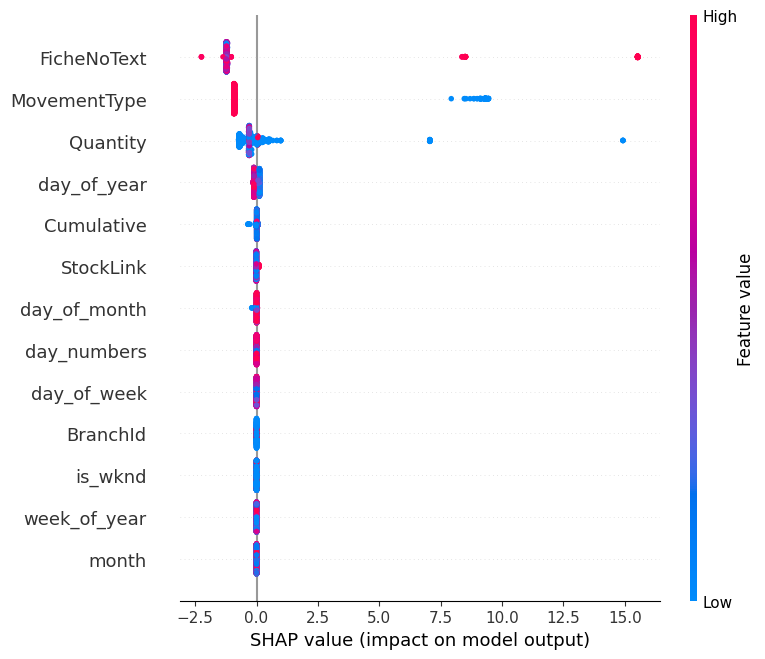

In [66]:
import shap 

shap.initjs()

explainer = shap.Explainer(lgb_model, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

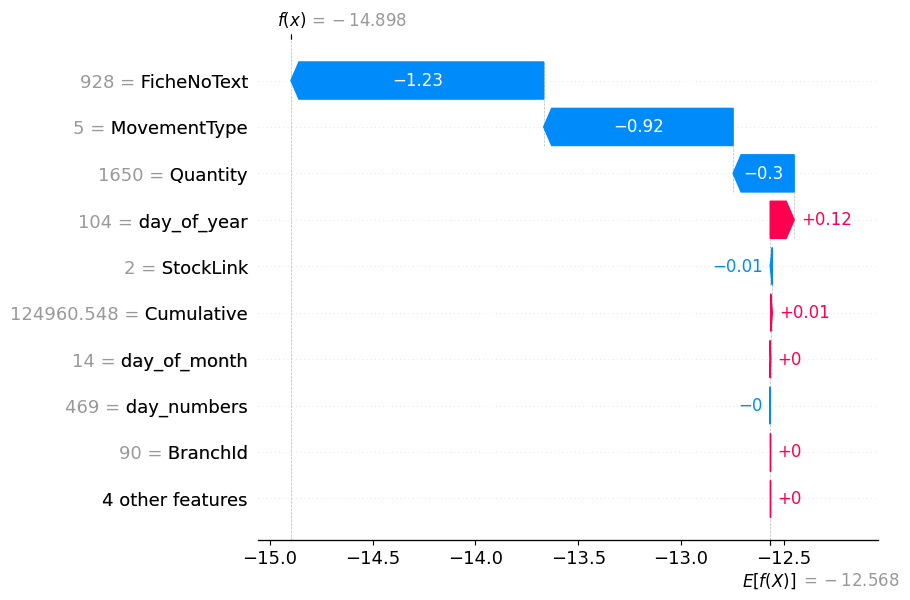

In [67]:
shap.plots.waterfall(shap_values[2])

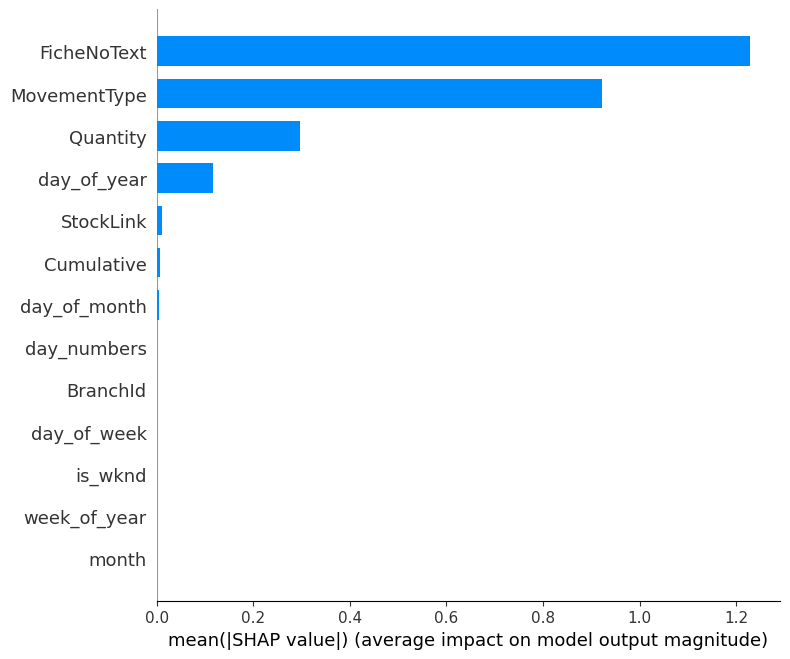

In [68]:
shap.summary_plot(shap_values[[2]], X_test, plot_type="bar")

In [69]:
shap.initjs()
shap.plots.force(shap_values[2])

In [70]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [71]:
classifier = RandomForestClassifier(n_estimators=1600,
                                 min_samples_split=5,
                                 min_samples_leaf=1,
                                 max_features='auto',
                                 max_depth=10,
                                 bootstrap=True)
classifier.fit(X_train, y_train)
cls_pred = classifier.predict(X_test)

### Lime

In [73]:
import lime 
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    class_names = ['-1', '1'],
    mode='classification'
)

xgb_exp = explainer.explain_instance(
    data_row = X_test.iloc[3],
    predict_fn = lgb_model.predict_proba
)

xgb_exp.show_in_notebook(show_table = True)

### Shap

 94%|=================== | 737/781 [00:16<00:00]       

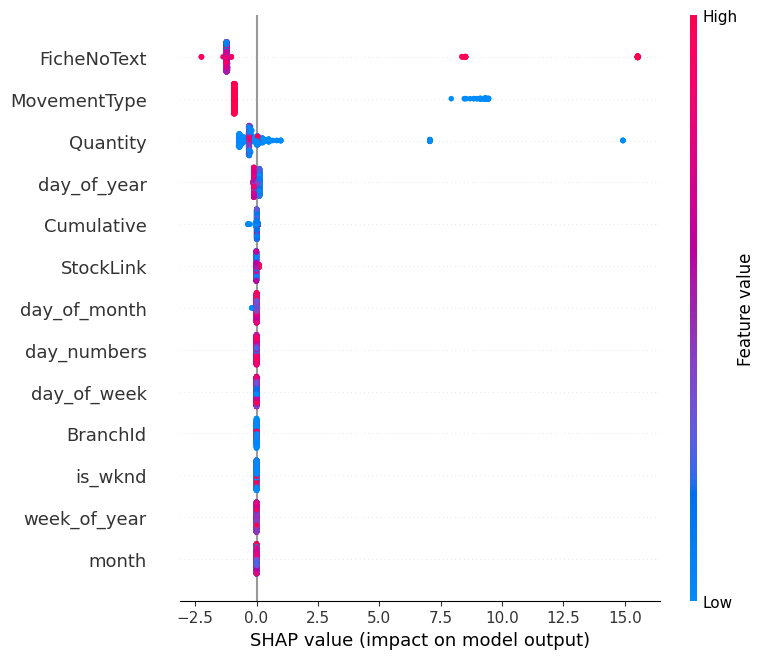

In [74]:
import shap 

shap.initjs()

explainer = shap.Explainer(lgb_model, X_train)

shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)

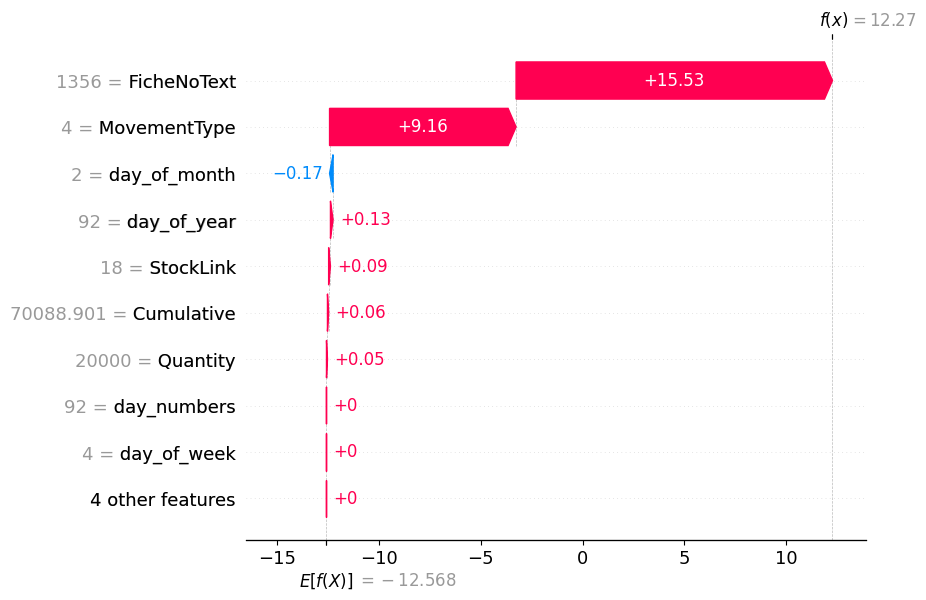

In [75]:
shap.plots.waterfall(shap_values[3])

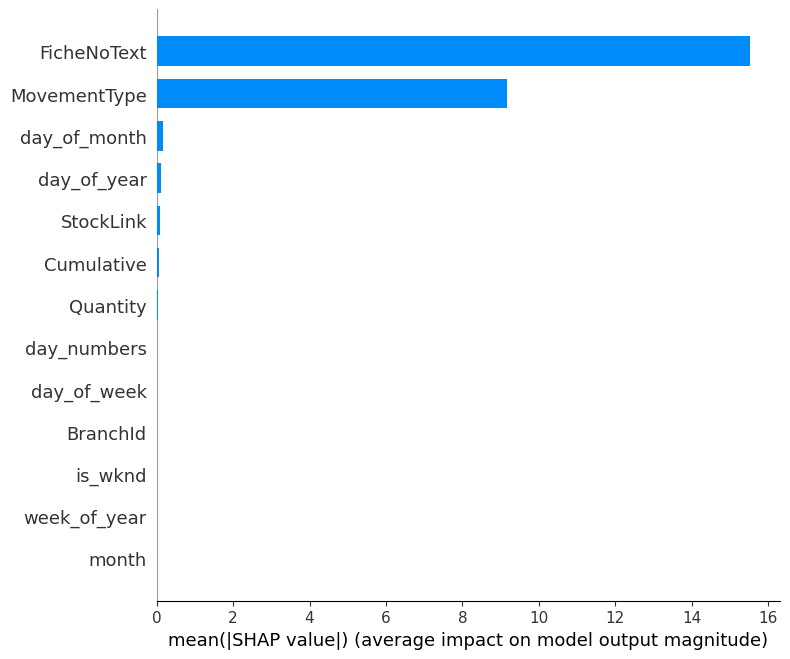

In [76]:
shap.summary_plot(shap_values[[3]], X_test, plot_type="bar")

In [77]:
shap.initjs()
shap.plots.force(shap_values[3])

In [78]:
print('LİGHT-GBM Accuracy Score: ',accuracy_score(y_test, predicts))
print('XG-Boost Accuracy Score: ',accuracy_score(y_test, preds))
print('Random Forest Classifier Accuracy Score: ',accuracy_score(y_test, cls_pred))

LİGHT-GBM Accuracy Score:  0.9974391805377721
XG-Boost Accuracy Score:  0.998719590268886
Random Forest Classifier Accuracy Score:  0.998719590268886


# Validasyon Tahmin

In [79]:
print(sample_data.head())

      BranchId  Type  Quantity  MovementType  FicheNoText  StockLink  \
3243        90    -1    5250.0             5         1056          1   
4070        90    -1    5200.0             5         1058          1   
3054        90    -1    5200.0             5         1058          1   
3193        90    -1    2650.0             5         1059          2   
4209        90    -1    2650.0             5         1059          2   

      day_of_year  day_numbers  month  day_of_month  week_of_year  \
3243          165          530      6            14            24   
4070          166          531      6            15            24   
3054          166          531      6            15            24   
3193          166          531      6            15            24   
4209          166          531      6            15            24   

      day_of_week  is_wknd   Cumulative  
3243            1        0  360083.7056  
4070            2        0  354883.7056  
3054            2        0

## Orjinal Kümülatif Veriler Üzerinden Kontrol Etmek

In [80]:
for i in range(len(sample_data['Cumulative']) - 1):
    if sample_data['Cumulative'].iloc[i + 1] > sample_data['Cumulative'].iloc[i]:
        print('Alınan miktar : ', (sample_data['Cumulative'].iloc[i + 1] - sample_data['Cumulative'].iloc[i]), 
              '| Gün: ', sample_data['day_numbers'].iloc[i + 1],
             'index',sample_data.index[i +1],
             '| Önceki Miktar:',sample_data['Cumulative'].iloc[i],
             '| Sonraki Miktar:',sample_data['Cumulative'].iloc[i +1])              

Alınan miktar :  27000.0 | Gün:  532 index 3333 | Önceki Miktar: 339083.70559999975 | Sonraki Miktar: 366083.70559999975
Alınan miktar :  27000.0 | Gün:  532 index 2317 | Önceki Miktar: 355383.70559999975 | Sonraki Miktar: 382383.70559999975
Alınan miktar :  27000.0 | Gün:  540 index 2365 | Önceki Miktar: 283583.70559999975 | Sonraki Miktar: 310583.70559999975
Alınan miktar :  27000.0 | Gün:  540 index 3381 | Önceki Miktar: 299483.70559999975 | Sonraki Miktar: 326483.70559999975
Alınan miktar :  27000.0 | Gün:  545 index 3334 | Önceki Miktar: 269883.70559999975 | Sonraki Miktar: 296883.70559999975
Alınan miktar :  27000.0 | Gün:  545 index 2318 | Önceki Miktar: 285583.70559999975 | Sonraki Miktar: 312583.70559999975
Alınan miktar :  27000.0 | Gün:  550 index 2350 | Önceki Miktar: 256248.21499999997 | Sonraki Miktar: 283248.21499999997
Alınan miktar :  27000.0 | Gün:  550 index 3366 | Önceki Miktar: 280148.21499999997 | Sonraki Miktar: 307148.21499999997
Alınan miktar :  27000.0 | Gün: 

## Makine Öğrenmesi Verileri Üzerinden Kontrol Etmek

In [81]:
regressor2 = RandomForestRegressor(n_estimators=150,
                                 min_samples_split=5,
                                 min_samples_leaf=2,
                                 max_features='auto',
                                 max_depth=None,
                                 bootstrap=True)
regressor2.fit(data.iloc[:, :-1], data.iloc[:, -1])
rfg_pred = regressor2.predict(sample_data.iloc[:, :-1])
cls_pred = classifier.predict(sample_others)
for i in range(len(rfg_pred) - 1):
    if (cls_pred[i] == 1):
            print('Alınan miktar: ',(rfg_pred[i + 1] - rfg_pred[i]), 
                  '|Gün:', sample_data['day_numbers'].iloc[i],
                  '|index:',sample_data.index[i],
                 '|Önceki Miktar:',rfg_pred[i], 
                  '|Sonraki Miktar:', rfg_pred[i + 1])

Alınan miktar:  -1598.0343920739833 |Gün: 532 |index: 3333 |Önceki Miktar: 384644.5592165786 |Sonraki Miktar: 383046.5248245046
Alınan miktar:  -767.0470292328973 |Gün: 532 |index: 2317 |Önceki Miktar: 384644.5592165786 |Sonraki Miktar: 383877.5121873457
Alınan miktar:  -328.3592253772076 |Gün: 540 |index: 2365 |Önceki Miktar: 386495.44125700707 |Sonraki Miktar: 386167.08203162986
Alınan miktar:  -328.3592253772076 |Gün: 540 |index: 3381 |Önceki Miktar: 386495.44125700707 |Sonraki Miktar: 386167.08203162986
Alınan miktar:  -1955.7309654654819 |Gün: 545 |index: 3334 |Önceki Miktar: 384156.68514895457 |Sonraki Miktar: 382200.9541834891
Alınan miktar:  -1863.1106278306106 |Gün: 545 |index: 2318 |Önceki Miktar: 384156.68514895457 |Sonraki Miktar: 382293.57452112396
Alınan miktar:  193.7900163650629 |Gün: 550 |index: 2350 |Önceki Miktar: 398244.37585002533 |Sonraki Miktar: 398438.1658663904
Alınan miktar:  193.7900163650629 |Gün: 550 |index: 3366 |Önceki Miktar: 398244.37585002533 |Sonraki 

## Skorlar

In [82]:
print('Random Forest Regressor R2 Score: ',r2_score(sample_data.iloc[:, -1], rfg_pred))
print('Random Forest Regressor MAE: ',mean_absolute_error(sample_data.iloc[:, -1], rfg_pred))
print('RANDOM FOREST MSE Score:',np.sqrt(mean_squared_error(sample_data.iloc[:, -1],rfg_pred)))
print('Random Forest Classifier Accuracy Score: ',accuracy_score(sample_data.iloc[:, 1:2], cls_pred))

Random Forest Regressor R2 Score:  -8.118400204644308
Random Forest Regressor MAE:  96287.724215262
RANDOM FOREST MSE Score: 101800.5082472772
Random Forest Classifier Accuracy Score:  0.05092592592592592


In [83]:
data.head()

,BranchId,Type,Quantity,MovementType,FicheNoText,StockLink,day_of_year,day_numbers,month,day_of_month,week_of_year,day_of_week,is_wknd,Cumulative
0,90,1,78850.0,0,1241,18,0,0,12,31,53,3,0,78850.0
1655,90,-1,2900.0,5,0,1,2,2,1,2,53,5,1,75950.0
1656,90,-1,1850.0,5,1,2,2,2,1,2,53,5,1,74100.0
1657,90,-1,100.0,5,61,1,3,3,1,3,53,6,1,74000.0
1658,90,-1,3550.0,5,2,1,4,4,1,4,1,0,0,70450.0


## Backward Elimination

In [84]:
import statsmodels.api as sm 

In [173]:
r_ols = sm.OLS(endog=data.iloc[:, -1], exog=data.iloc[:, :-1])
r = r_ols.fit()

In [174]:
print(r.summary())

                                 OLS Regression Results                                
Dep. Variable:             Cumulative   R-squared (uncentered):                   0.732
Model:                            OLS   Adj. R-squared (uncentered):              0.731
Method:                 Least Squares   F-statistic:                              815.5
Date:                Tue, 18 Jul 2023   Prob (F-statistic):                        0.00
Time:                        11:17:15   Log-Likelihood:                         -49956.
No. Observations:                3902   AIC:                                  9.994e+04
Df Residuals:                    3889   BIC:                                  1.000e+05
Df Model:                          13                                                  
Covariance Type:            nonrobust                                                  
                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

##### Üstekki raporda p değerine bakarak genelde 0.05'in üstünde olan columnları atabilirsin.

## GridSearch & RandomizedSearchCV

In [175]:
from sklearn.model_selection import GridSearchCV

In [176]:
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
rfg_params={  "n_estimators" : [10 , 50, 100, 150 ,750] ,
              "max_features": ['auto', 'sqrt'],
              "max_depth" : max_depth , 
              "min_samples_leaf": [1, 2, 4],
              "min_samples_split": [2, 5, 10],
              "bootstrap": [True, False]}

In [177]:
rfg_cv_model=GridSearchCV(regressor2 ,
                           rfg_params , 
                           cv=10 ,
                           n_jobs=-1,
                           verbose=2)

In [178]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size = 0.2)

In [ ]:
rfg_cv_model.fit(X_train , y_train)

In [ ]:
rfg_cv_model.best_params_ 

In [ ]:
'''
from sklearn.model_selection import RandomizedSearchCV
#Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
#Number of features to consider at every split
max_features = ['auto', 'sqrt']
#Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
#Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
#Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
#Method of selecting samples for training each tree
bootstrap = [True, False]
#Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
'''

In [ ]:
'''
#Use the random grid to search for best hyperparameters
#First create the base model to tune
#Random search of parameters, using 3 fold cross validation, 
#search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
#Fit the random search model
rf_random.fit(X_train, y_train)
'''

In [ ]:
#rf_random.best_params_

## Anlık yakalanan en iyi Hiperparametreler

Random Forest = {'n_estimators': 1600,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}
 
LİGHT-GBM = {'colsample_bytree': 1,
 'learning_rate': 0.01,
 'max_depth': 9,
 'n_estimators': 1500}

## Cross Validation

In [179]:
from sklearn.model_selection import cross_val_score

In [180]:
print(cross_val_score(regressor,data.iloc[:, :-1], data['Cumulative'], scoring = 'neg_mean_absolute_error', cv = 5))

[ -21990.12618     -19388.05814422  -12527.4291837   -36425.23719342
 -181758.57059739]


In [181]:
print(cross_val_score(lgb_model, others, types , cv = 5))

[0.99871959 0.99871959 1.         1.         1.        ]


In [182]:
print(cross_val_score(classifier,others, types, cv = 5))

[0.99871959 0.99871959 1.         1.         1.        ]
